# SYDE 556/750 --- Assignment 5

## Due Date: Dec 2, 2022


**Student ID: 20757197**

*Note:* Please include your numerical student ID only, do *not* include your name.

*Note:* Unlike assignments 1-4, for this assignment the full instructions (including some hints) are in this file.  The cells you need to fill out are marked with a "writing hand" symbol. Of course, you can add new cells in between the instructions, but please leave the instructions intact to facilitate marking.

- This assignment is worth 30 marks (30% of the final grade). The number of marks for each question is indicated in brackets to the left of each question.

- Clearly label any plot you produce, including the axes. Provide a legend if there are multiple lines in the same plot.

- You won’t be judged on the quality of your code.

- All questions use the nengo default of Leaky Integrate-and-Fire neurons with the default parameter settings (`tau_rc=0.02` and `tau_ref=0.002`).

- Make sure to execute the Jupyter command “Restart Kernel and Run All Cells” before submitting your solutions. You will lose marks if your code fails to run or produces results that differ significantly from what you’ve submitted.

- Rename the completed notebook to `syde556_assignment_05_<STUDENT ID>.ipynb` and submit it via email to the TA (Nicole Dumont <ns2dumont@uwaterloo.ca>). The deadline is at 23:59 EST on Dec 2, 2022.

- There is a late penalty of one mark per day late. Please contact celiasmith@uwaterloo.ca if there are extenuating circumstances.

- **For this assignment, you must use [Nengo](https://www.nengo.ai/getting-started/).** Feel free to look through the examples folder and/or the tutorials on the Nengo website before doing this assignment.



In [1]:
# Import numpy and matplotlib
import numpy as np
import matplotlib.pyplot as plt

import nengo

# Fix the numpy random seed for reproducible results
np.random.seed(18945)

# Some formating options
%config InlineBackend.figure_formats = ['svg']

# 1. Building an Accumulate-to-Threshold Decision Making Model

One standard account for how brains make simple decision-making tasks is that they gradually accumulate evidence for or against something, and when that evidence hits some threshold, a decision is made.  This sort of model is used to account for the fact that people take longer to make decisions when the evidence is weak.

If you want more background on this, https://www.jneurosci.org/content/34/42/13870 gives a decent overview, but this diagram shows a high-level overview:

![](https://www.jneurosci.org/content/jneuro/34/42/13870/F1.large.jpg)

We're going to make a model of this process. It will make its choice based on a single input value, which gives some evidence as to which choice should be made.  It will indicate a choice by outputting either a 1 or a -1.  If that input evidence is positive, it will be more likely to make the first choice (outputting a 1), and if the input evidence is negative it will be more likely to make the second choice (outputting a -1).

*TIP: The Nengo GUI built-in tutorials 10 through 18 may be useful to give you an overview of different recurrent systems and different ways of modifying ```Ensembles```.*



**a) Accumulation. [2 marks]** Start by building a recurrent system that can add up evidence over time (the accumulator or integrator).  This is a neural ```Ensemble``` that holds a single dimension, and uses a small number of neurons (50).  Provide it with one input ```Node``` that has a constant value of ```[0.1]``` and connect that input into the ```Ensemble``` with a ```Connection```.  Now make a ```Connection``` from the ```Ensemble``` back to itself that computes the identity function.  Since this ```Connection``` is accumulating evidence over time, we want it to be fairly stable, so set ```synapse=0.1``` on this ```Connection``` (leave the other `Connection` at its default value).  This means that the neurotransmitter being used will spread out over 100ms, rather than the default 5ms.

If you run the above system with the constant positive input of 0.1 as noted above, the value stored in the accumulator should gradually increase until it hits 1 (this should take about 1 second of simulated time).  If you change the input to be -0.1, it should gradually decrease until it hits -1.

Make a single plot that shows the behaviour of the model for four different inputs: 0.2, 0.1, -0.1, and -0.2.  For each input, run the model for 2 seconds (`sim.run(2)`) and plot the value stored in the accumulator `Ensemble`.  Use a `Probe` synapse of 0.01 to get the stored value.

C:\Users\nickb\AppData\Local\Programs\Python\Python39\lib\site-packages\nengo\cache.py:609: UserWarning: Decoder cache could not acquire lock and was set to readonly mode.
  warnings.warn(


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

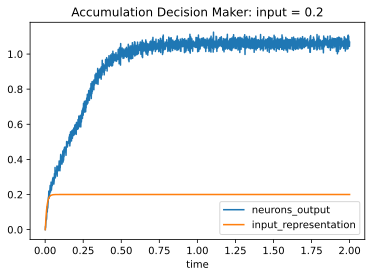

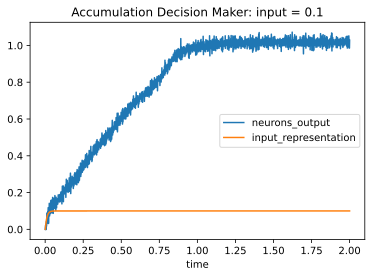

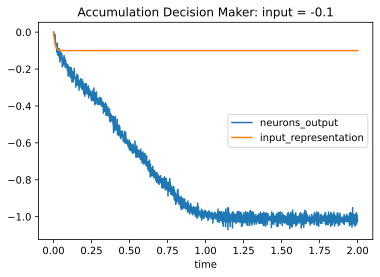

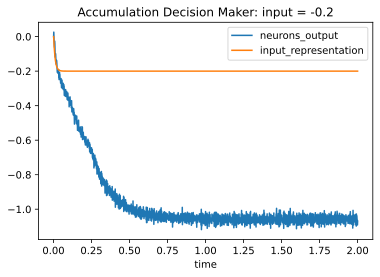

In [2]:
def q1a(input=lambda t: 0.2 if t >= 0 else 0, num_neurons=50, recurrent_synapse=0.1, connection_synapse=0.1,
    probe_synapse=0.01, sim_time=2, plot_title=''):
    
    def recurrent_function(x):
        return 1 * x
    
    model = nengo.Network()
    dims = 1

    with model:
        input_node = nengo.Node(input)
        neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=dims)
        
        nengo.Connection(input_node, neurons)
        nengo.Connection(neurons, neurons, function=recurrent_function, synapse=recurrent_synapse)

        input_probe = nengo.Probe(input_node, synapse=probe_synapse)
        neurons_probe = nengo.Probe(neurons, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)

    time_range = sim.trange()
    input_representation = sim.data[input_probe]
    neurons_data = sim.data[neurons_probe]

    plt.figure()
    plt.plot(time_range, neurons_data, label='neurons_output')
    plt.plot(time_range, input_representation, label='input_representation')
    plt.legend()
    plt.xlabel('time')
    plt.title(plot_title)


q1a(input=lambda t: 0.2 if t >= 0 else 0, plot_title='Accumulation Decision Maker: input = 0.2')
q1a(input=lambda t: 0.1 if t >= 0 else 0, plot_title='Accumulation Decision Maker: input = 0.1')
q1a(input=lambda t: -0.1 if t >= 0 else 0, plot_title='Accumulation Decision Maker: input = -0.1')
q1a(input=lambda t: -0.2 if t >= 0 else 0, plot_title='Accumulation Decision Maker: input = -0.2')

**b) Accumulator Discussion. [1 mark]** What is the mathematical computation being performed here (i.e. what is the relationship between the input and the output)?  Why does the value stop increasing (or decreasing) when it hits +1 (or -1)?

The mathematical computation being performed here is a linear relationship between the input and output. In other words, the input is added to the previous output value to create the new output every timestep. The rate that this linear accumulation occurs at has the value of the input added to the previous output approximately every 0.1 seconds. This can be seen from the 0.1 input taking 1 second to reach a value of approximately 1, and an input of 0.2 taking 0.5 seconds to reach a value of approximately 1. This relationship holds true for the negative inputs as well, but just going to a value of -1 instead of 1.

The value stops increasing/decreasing when it hits 1 or -1 because the encoders force the values to remain in that range due to the radius of the model, and thus the neuron ensemble cannot represent values outside of the [1, -1] range.

**c) Adding random noise to the neurons. [1 mark]** Next, we can add randomness to the neurons.  In standard (non-neural) accumulator models, there is a "random-walk" component that randomly varies the value being accumulated.  We can model this by adding random noise into the ```Ensemble```, which means adding random current to each of the neurons.  The command for this is:

```python
acc.noise = nengo.processes.WhiteSignal(period=10, high=100, rms=1)
```

(where ```acc``` is whatever name you gave your accumulator ```Ensemble```.)

The strength of this noise is set by the ```rms=1``` parameter.  Generate the same plot as in part (a) but with the noise `rms=1`.  Also generate the same plot for `rms=3`, `rms=5`, and `rms=10`.  What happens to the resulting output?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

C:\Users\nickb\AppData\Local\Programs\Python\Python39\lib\site-packages\nengo\cache.py:609: UserWarning: Decoder cache could not acquire lock and was set to readonly mode.
  warnings.warn(


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

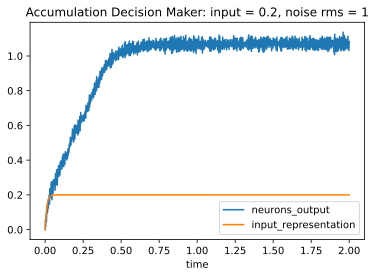

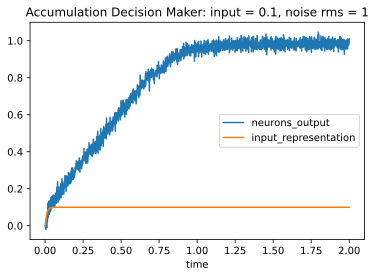

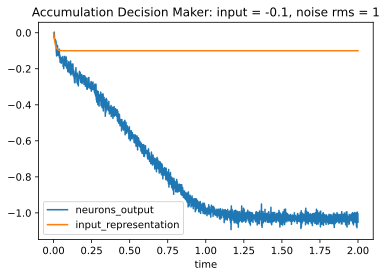

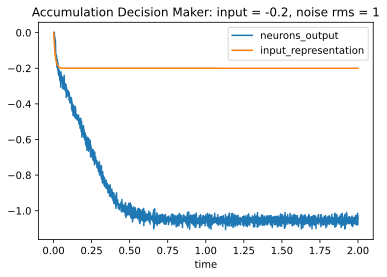

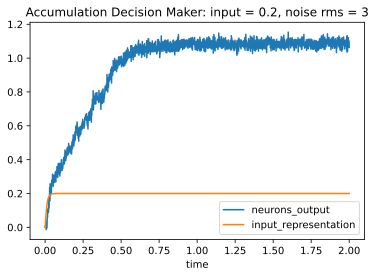

...

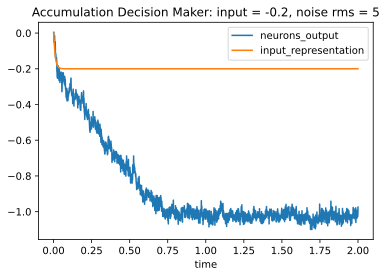

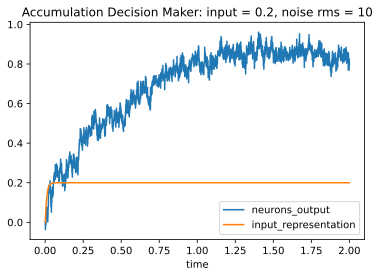

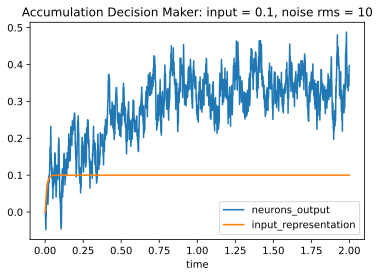

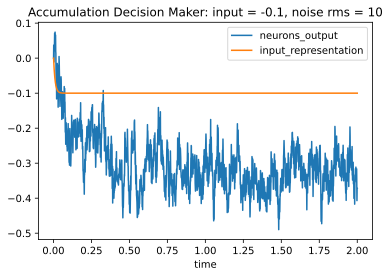

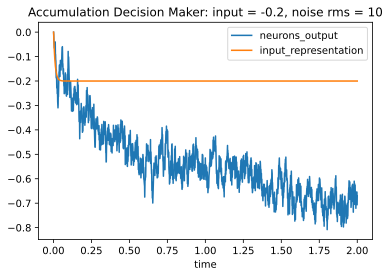

In [3]:
def q1c(input=lambda t: 0.2 if t >= 0 else 0, num_neurons=50, recurrent_synapse=0.1, connection_synapse=0.1,
    probe_synapse=0.01, noise_rms=0, sim_time=2, plot_title=''):
    
    def recurrent_function(x):
        return 1 * x
    
    noise = nengo.processes.WhiteSignal(period=10, high=100, rms=noise_rms)
    
    model = nengo.Network()
    dims = 1

    with model:
        input_node = nengo.Node(input)
        neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=dims)
        neurons.noise = noise
        
        nengo.Connection(input_node, neurons)
        nengo.Connection(neurons, neurons, function=recurrent_function, synapse=recurrent_synapse)

        input_probe = nengo.Probe(input_node, synapse=probe_synapse)
        neurons_probe = nengo.Probe(neurons, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)

    time_range = sim.trange()
    input_representation = sim.data[input_probe]
    neurons_data = sim.data[neurons_probe]

    plt.figure()
    plt.plot(time_range, neurons_data, label='neurons_output')
    plt.plot(time_range, input_representation, label='input_representation')
    plt.legend()
    plt.xlabel('time')
    plt.title(plot_title)

noise_rms = [1, 3, 5, 10]
for x in noise_rms:
    q1c(input=lambda t: 0.2 if t >= 0 else 0, plot_title=f'Accumulation Decision Maker: input = 0.2, noise rms = {x}', noise_rms = x)
    q1c(input=lambda t: 0.1 if t >= 0 else 0, plot_title=f'Accumulation Decision Maker: input = 0.1, noise rms = {x}', noise_rms = x)
    q1c(input=lambda t: -0.1 if t >= 0 else 0, plot_title=f'Accumulation Decision Maker: input = -0.1, noise rms = {x}', noise_rms = x)
    q1c(input=lambda t: -0.2 if t >= 0 else 0, plot_title=f'Accumulation Decision Maker: input = -0.2, noise rms = {x}', noise_rms = x)

As can be seen in the plots above, increasing the RMS of the noise signal in the ensemble causes the model to perform worse. As well, the outputs do not saturate as quickly due to perturbations from the noise. Overall, the resulting output degrades with increasing noise rms values, which is the expected outcome.

**e) Adding decision-making. [2 marks]** To complete the basic model, we want to determine when this accumulator passes some threshold.  If the value becomes large enough, we should make one choice (+1), and if it becomes small enough we should make the other choice (-1).  To achieve this, make a new output ```Ensemble``` that is also one-dimensional and has 50 neurons.  Form a ```Connection``` from the accumulator to this new ```Ensemble``` that computes the following function:

```python
def choice(x):
    if x[0] > 0.9:
        return 1
    elif x[0] < -0.9:
        return -1
    else: 
        return 0
```

This new output should now stay at zero until the accumulator value gets large enough, and then quickly move to +1 or -1.

Build this model and plot the output of both the accumulator `Ensemble` and the decision-making `Ensemble`.  Use a noise `rms=3` and for both `Probe`s use a synapse of 0.01.  Do this for all four input values (0.2, 0.1, -0.1, and -0.2).

How well does the system perform?  Does it make decisions faster when there is stronger evidence?  What differences are there (if any) between the computation we are asking the system to perform and the actual result?

*TIP: try running the model a few times to see the variability in the output*

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

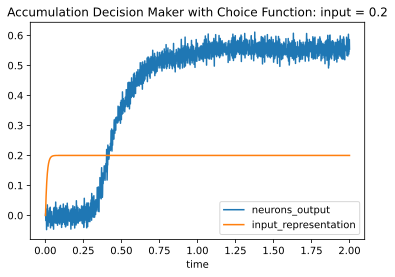

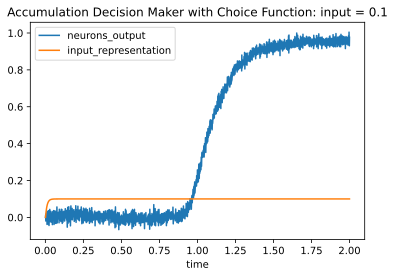

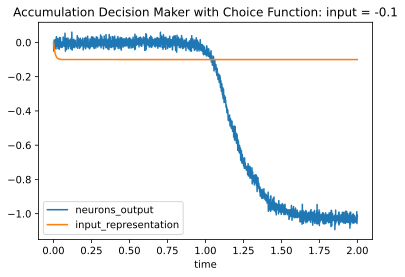

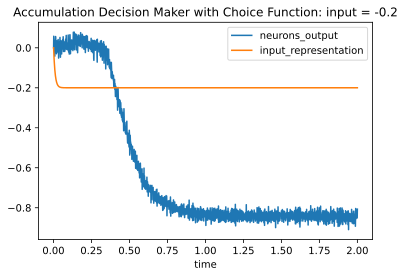

In [4]:
def q1e(input=lambda t: 0.2 if t >= 0 else 0, num_neurons=50, recurrent_synapse=0.1, connection_synapse=0.1,
    probe_synapse=0.01, noise_rms=0, function=None, sim_time=2, plot_title=''):
    
    def recurrent_function(x):
        return 1 * x
    
    noise = nengo.processes.WhiteSignal(period=10, high=100, rms=noise_rms)
    
    model = nengo.Network()
    dims = 1

    with model:
        input_node = nengo.Node(input)
        neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=dims)
        neurons.noise = noise
        
        nengo.Connection(input_node, neurons)
        nengo.Connection(neurons, neurons, function=recurrent_function, synapse=recurrent_synapse)

        input_probe = nengo.Probe(input_node, synapse=probe_synapse)
        neurons_probe = nengo.Probe(neurons, synapse=probe_synapse)
        
        if function != None:
            neurons_2 = nengo.Ensemble(n_neurons=num_neurons, dimensions=dims)
            nengo.Connection(neurons, neurons_2, function=function, synapse=connection_synapse)
            neurons_2_probe = nengo.Probe(neurons_2, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)

    time_range = sim.trange()
    input_representation = sim.data[input_probe]
    neurons_data = sim.data[neurons_probe]
    if function != None:
        neurons_data = sim.data[neurons_2_probe]

    plt.figure()
    plt.plot(time_range, neurons_data, label='neurons_output')
    plt.plot(time_range, input_representation, label='input_representation')
    plt.legend()
    plt.xlabel('time')
    plt.title(plot_title)

def choice(x):
    if x[0] > 0.9:
        return 1
    elif x[0] < -0.9:
        return -1
    else:
        return 0

inputs = [0.2, 0.1, -0.1, -0.2]
plot_titles = ['Accumulation Decision Maker with Choice Function: input = 0.2',
               'Accumulation Decision Maker with Choice Function: input = 0.1',
               'Accumulation Decision Maker with Choice Function: input = -0.1',
               'Accumulation Decision Maker with Choice Function: input = -0.2']
for i in range(len(inputs)):
    q1e(input=lambda t: inputs[i] if t >= 0 else 0, plot_title=plot_titles[i], noise_rms = 3, function=choice)

The model performs well and as expected as the model makes the correct decisions, with higher +/- inputs making the corresponding decision happen more quickly. The decisions happen faster with stronger evidence, as seen with the difference in time taken to make a decision between abs(0.1, 0.2), i.e., the model makes a decision ~twice as fast when the evidence is twice as strong. The only differnce I see between the computation we are asking the system to perform and the actual result is that it takes longer to reach +/- 1 after the decision has been made when the absolute values of the inputs are smaller instead of displaying +/- 1 as quickly as possible, which is due to the output ensemble of neurons being affected by the output of the first ensemble of neurons.

**f) Combining Ensembles. [2 marks]** An alternative implementation would be to combine the two separate 1-dimensional `Ensembles` into one 2-dimensional `Ensemble`.  The Connections are made similarly as in the original model, but they need to target the particular dimensions involved using the ```ens[0]``` and ```ens[1]``` syntax.  Try building the model this way and plot the results.  Do this for a single `Ensemble` with 100 neurons (the same number as the total number of neurons in the original model) and with 500 neurons.  Also, be sure to increase the `radius` as would be appropriate in order to produce values like what we had in the original model, where the accumulator might be storing a 1 and the output might be a 1.

How does combining Ensembles in this way change the performance of the system?  

When the Ensembles are combined together in this way, what are we changing about the biological claims about the model?  In particular, how might we determine whether the real biologicial system has these as separate `Ensembles` or combined together?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

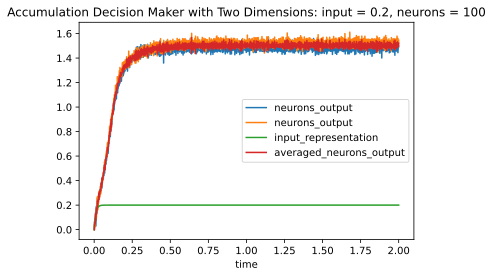

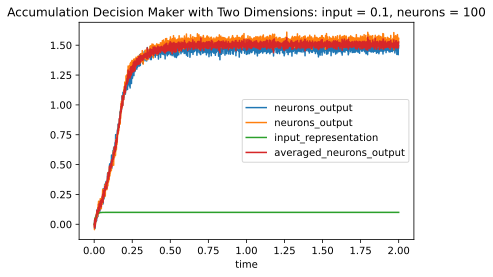

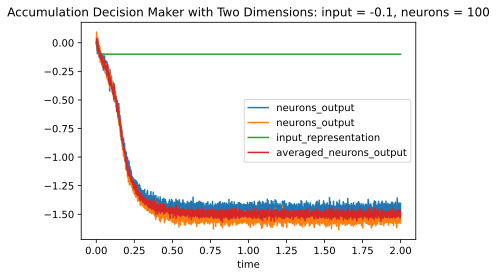

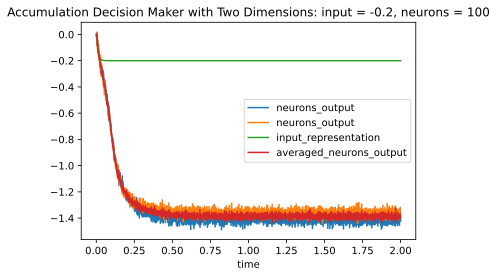

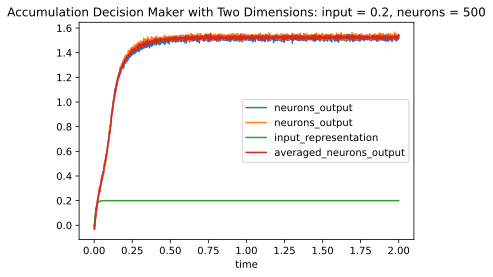

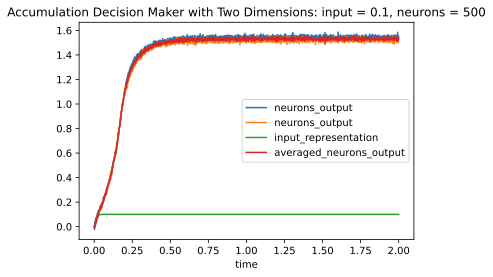

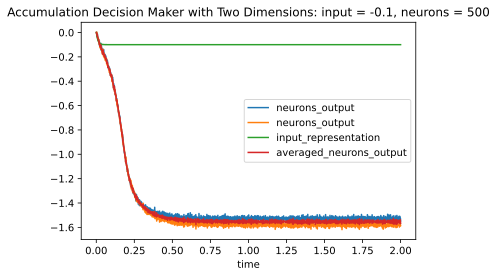

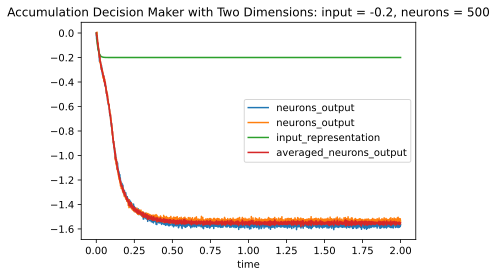

In [5]:
def q1f(input=lambda t: 0.2 if t >= 0 else 0, num_neurons=50, recurrent_synapse=0.1, connection_synapse=0.1,
    probe_synapse=0.01, noise_rms=None, function=None, sim_time=2, plot_title=''):
    
    def recurrent_function(x):
        return [x[0] + x[1], x[0] + x[1]]
    
#     noise = nengo.processes.WhiteSignal(period=10, high=100, rms=noise_rms)
    
    model = nengo.Network()
    dims = 2

    with model:
        input_node = nengo.Node(input)
        neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=dims, radius=np.sqrt(2))
#         neurons.noise = noise
        
        nengo.Connection(input_node, neurons[0])
        nengo.Connection(input_node, neurons[1])
        nengo.Connection(neurons, neurons, function=recurrent_function, synapse=recurrent_synapse)

        input_probe = nengo.Probe(input_node, synapse=probe_synapse)
        neurons_probe = nengo.Probe(neurons, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)

    time_range = sim.trange()
    input_representation = sim.data[input_probe]
    neurons_data = sim.data[neurons_probe]
    averaged_output = [(x[0] + x[1]) / 2 for x in sim.data[neurons_probe]]
    if function != None:
        neurons_data = sim.data[neurons_2_probe]

    plt.figure()
    plt.plot(time_range, neurons_data, label='neurons_output')
    plt.plot(time_range, input_representation, label='input_representation')
    plt.plot(time_range, averaged_output, label='averaged_neurons_output')
    plt.legend()
    plt.xlabel('time')
    plt.title(plot_title)

inputs = [0.2, 0.1, -0.1, -0.2]
neuron_amounts = [100, 500]
for neurons in neuron_amounts:
    plot_titles = [f'Accumulation Decision Maker with Two Dimensions: input = 0.2, neurons = {neurons}',
               f'Accumulation Decision Maker with Two Dimensions: input = 0.1, neurons = {neurons}',
               f'Accumulation Decision Maker with Two Dimensions: input = -0.1, neurons = {neurons}',
               f'Accumulation Decision Maker with Two Dimensions: input = -0.2, neurons = {neurons}']
    for i in range(len(inputs)):
        q1f(input=lambda t: inputs[i] if t >= 0 else 0, plot_title=plot_titles[i], num_neurons=neurons)

Combining the neurons in this way changes the performance of the system by making the outputs become saturated much more quickly than when only one dimension was used.

When combining ensembles in this way, we are stating that biologically the model is accumulating information from multiple dimensions of input information to make decisions. This is more likely to be what happens in reality as neurons are connected to a large assortment of other neurons that carry ranges of information for input to be used for decisions. Practically, this also makes sense, as decisions often have multiple streams of information that must be considered, such as the distance and direction needed to travel for food.

**g) Improving Representation [2 marks].** Returning to the original implementation from section (e) (with 2 separate Ensembles), we can improve the performance by adjusting the tuning curves of the second `Ensemble`.  Do this by setting `intercepts = nengo.dists.Uniform(0.4, 0.9)`.  This randomly chooses the x-intercepts of the neurons uniformly between 0.4 and 0.9, rather than the default of -1 to 1.  Generate the same plot as in part (e).

How does this affect the performance of the model?  (Try running the model a few times to see the variability in performance). 

Why does the output stay at exactly zero up until the decision is made (rather than being randomly jittering around zero, as in the previous models)?  

Why couldn't we use this approach in the case from part (f) where the `Ensembles` are combined?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

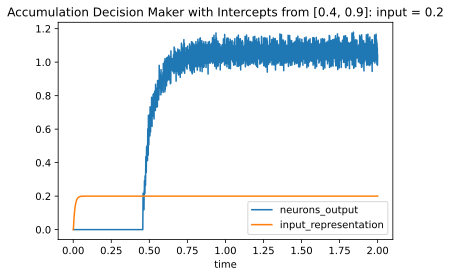

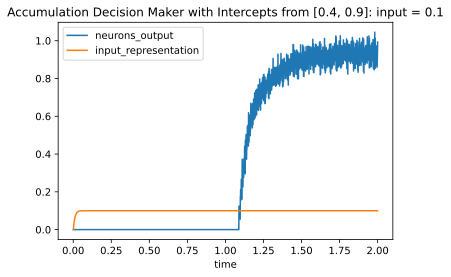

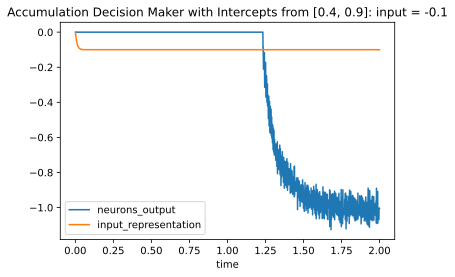

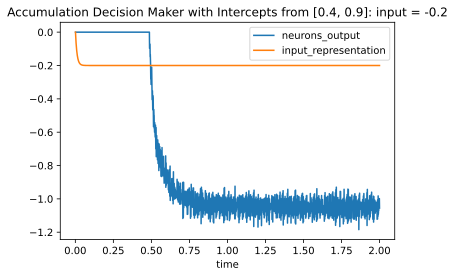

In [6]:
def q1g(input=lambda t: 0.2 if t >= 0 else 0, num_neurons=50, recurrent_synapse=0.1, connection_synapse=0.1,
    probe_synapse=0.01, noise_rms=0, function=None, intercepts=None, sim_time=2, plot_title=''):
    
    def recurrent_function(x):
        return 1 * x
    
    noise = nengo.processes.WhiteSignal(period=10, high=100, rms=noise_rms)
    
    model = nengo.Network()
    dims = 1

    with model:
        input_node = nengo.Node(input)
        neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=dims)
        neurons.noise = noise
        
        nengo.Connection(input_node, neurons)
        nengo.Connection(neurons, neurons, function=recurrent_function, synapse=recurrent_synapse)

        input_probe = nengo.Probe(input_node, synapse=probe_synapse)
        neurons_probe = nengo.Probe(neurons, synapse=probe_synapse)
        
        if function != None:
            neurons_2 = nengo.Ensemble(n_neurons=num_neurons, dimensions=dims)
            if intercepts != None:
                neurons_2.intercepts = intercepts
            nengo.Connection(neurons, neurons_2, function=function, synapse=connection_synapse)
            neurons_2_probe = nengo.Probe(neurons_2, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)

    time_range = sim.trange()
    input_representation = sim.data[input_probe]
    neurons_data = sim.data[neurons_probe]
    if function != None:
        neurons_data = sim.data[neurons_2_probe]

    plt.figure()
    plt.plot(time_range, neurons_data, label='neurons_output')
    plt.plot(time_range, input_representation, label='input_representation')
    plt.legend()
    plt.xlabel('time')
    plt.title(plot_title)

def choice(x):
    if x[0] > 0.9:
        return 1
    elif x[0] < -0.9:
        return -1
    else:
        return 0

inputs = [0.2, 0.1, -0.1, -0.2]
plot_titles = ['Accumulation Decision Maker with Intercepts from [0.4, 0.9]: input = 0.2',
               'Accumulation Decision Maker with Intercepts from [0.4, 0.9]: input = 0.1',
               'Accumulation Decision Maker with Intercepts from [0.4, 0.9]: input = -0.1',
               'Accumulation Decision Maker with Intercepts from [0.4, 0.9]: input = -0.2']
intercepts = nengo.dists.Uniform(0.4, 0.9)
for i in range(len(inputs)):
    q1g(input=lambda t: inputs[i] if t >= 0 else 0, plot_title=plot_titles[i], 
        noise_rms = 3, function=choice, intercepts=intercepts)

Setting the x-intercepts of the model to range from [0.4, 0.9] improved model performance compared to part e) as the input no longer is noisy around 0 before making a decision, and once decisions are made, the model outputs +/-1 much more quickly. The output stays exactly at zero until a decison is made due to new intercept range acting like a high-pass filter, as the neurons in the ensemble do not respond until they have input in the range of [0.4, 0.9] (which they would not have until a decision was made), whereas the model in part e) had intercepts from [-1, 1], causing some neurons to activate when the input was 0 before a decision was made and producing the noise. This approach would not work in the case from part f) as we only want to set the intercept range for the neuron ensemble that makes the decision and not the neuron ensemble that represents the input signal as doing so would distort the input signal. However, in part f) only one ensemble is used, and therefore the intercepts for the ensemble representing the input signal would range from also range from [0.4, 0.9], and would no longer accurately represent all the input signals.

# 2. Temporal Representation

In class, we discussed the Legendre Memory Unit (LMU), a method for storing input information over time.  This allows us to make connections where the function being computed is a function of the input over some window in time, rather having to be a function of the current input.

In this question, we will use this to build a model that can distinguish a 1Hz sine wave from a 2Hz sine wave.  Notice that it is impossible to perform this task without having information over time; if I just give you a single number at any given point in time, you can't tell whether it's from a 1Hz sine wave or a 2Hz sine wave.  So we need some method to store the previous input information, and that's what the LMU does.

**a) Representing Information over Time. [2 marks]** The core of the LMU is to compute the differential equation ${dx \over dt} = Ax + Bu$ where $A$ and $B$ are carefully chosen using the following math:

```python
A = np.zeros((q, q))
B = np.zeros((q, 1))
for i in range(q):
    B[i] = (-1.)**i * (2*i+1)
    for j in range(q):
        A[i,j] = (2*i+1)*(-1 if i<j else (-1.)**(i-j+1)) 
A = A / theta
B = B / theta        
```

Implement this in Nengo.  Use `theta=0.5` and `q=6`.  The model should consist of a single `Ensemble` that is `q`-dimensional. Use 1000 neurons in this `Ensemble`.  Use `synapse=0.1` on both the recurrent `Connection` and on the input `Connection`.

For the input, give a 1Hz sine wave for the first 2 seconds, and a 2Hz sine wave for the second 2 seconds.  This can be done with:

```python
stim = nengo.Node(lambda t: np.sin(2*np.pi*t) if t<2 else np.sin(2*np.pi*t*2))
```

Run the simulation for 4 seconds.  Plot `x` over the 4 seconds using a `Probe` with `synapse=0.01`.  `x` should be 6-dimensional, and there should be a noticable change between its value before `t=2` and after `t=2`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

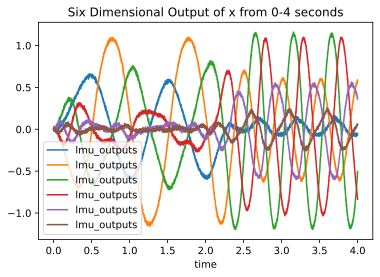

In [7]:
def choosing_AB(q=6, theta=0.5):
    A = np.zeros((q, q))
    B = np.zeros((q, 1))
    for i in range(q):
        B[i] = (-1.0) ** i * (2 * i + 1)
        for j in range(q):
            A[i, j] = (2 * i + 1) * (-1 if i < j else (-1.0) ** (i - j + 1))
    A = A / theta
    B = B / theta
    return A, B


def q2a(input=lambda t: np.sin(2 * np.pi * t) if t < 2 else np.sin(2 * np.pi * t * 2), num_neurons=1000, recurrent_synapse=0.1,
        probe_synapse=0.01, sim_time=4, plot_title='', q=6, theta=0.5):

    model = nengo.Network()

    with model:
        input_node = nengo.Node(input)
        lmu_neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=q)
        
        A, B= choosing_AB(q=q, theta=theta)
        A_transform = recurrent_synapse * A + np.identity(A.shape[0])
        B_transform = recurrent_synapse * B
        
        nengo.Connection(input_node, lmu_neurons, transform=B_transform, synapse=recurrent_synapse)
        nengo.Connection(lmu_neurons, lmu_neurons, synapse=recurrent_synapse, transform=A_transform)
        lmu_probe = nengo.Probe(lmu_neurons, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)
    time_range = sim.trange()

    lmu_data = sim.data[lmu_probe]
    
    plt.figure()
    plt.plot(time_range, lmu_data, label='lmu_outputs')
    plt.legend()
    plt.xlabel('time')
    plt.title(plot_title)
    
    return lmu_data


lmu_data = q2a(plot_title='Six Dimensional Output of x from 0-4 seconds')

**b) Computing the function. [2 marks]** We now want to compute our desired function, which is "output a 1 if we have a 1Hz sine wave and a 0 if we have a 2Hz sine wave".  To do this, we need to make a `Connection` from the LMU `Ensemble` out to a new `Ensemble` that will be our category.  Have it be 1-dimensional with 50 neurons.

Normally in Nengo, when we define a `Connection` we specify a Python function that we want to approximate.  Nengo will then choose a bunch of random `x` values, call the function to determine what the output should be for each one, and use that to solve for the decoders.  However, in this case, we already have that set of `x` values!  That's exactly the data you plotted in part (a).  For the `x` values from t=0 to t=2.0 we want an output of 1.  For the `x` values from t=2.0 to t=4.0, we want an output of -1.  So, to specify these target values, we make a matrix of size `(4000,1)` (4000 for the 4000 time steps that you have `x` values for, and 1 for the output being 1-dimensional).  Set the first 2000 values to 1 and the second 2000 values to -1.

Now that you have your `x` values and the corresponding `target` values, you can tell Nengo to use them when you make the `Connection` like this:

```python
nengo.Connection(a, b, eval_points=x_values, function=target)
```

That will tell Nengo just to use the values you're giving it, rather than randomly sampling `x` and calling a function to get the target values.

Build this model and plot the resulting category (with a `Probe` with `synapse=0.01`).  The output should be near 1 for the first 2 seconds, and near -1 for the second 2 seconds.  (Important note: it will not be perfect at this task!)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

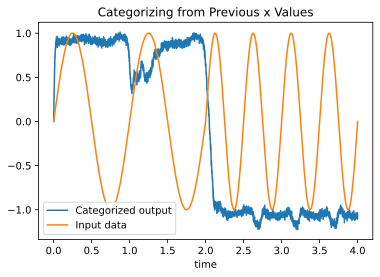

In [8]:
def calc_rmse(output, target):
    return np.sqrt(np.mean(np.power(output - target, 2)))

def target_generation(size=(4000, 1), first_category=1, second_category=-1, transition=2000):
    target = np.ones(size) * first_category
    for i in range(transition):
        target[transition + i][0] = second_category
    return target

def q2b(input=lambda t: np.sin(2 * np.pi * t) if t < 2 else np.sin(2 * np.pi * t * 2), num_neurons=1000, recurrent_synapse=0.1,
        probe_synapse=0.01, sim_time=4, plot_title='', q=6, theta=0.5, x_values=[], rmse=False):

    model = nengo.Network()

    with model:
        input_node = nengo.Node(input)
        lmu_neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=q)
        category = nengo.Ensemble(n_neurons=50, dimensions=1)
        
        A, B= choosing_AB(q=q, theta=theta)
        A_transform = recurrent_synapse * A + np.identity(A.shape[0])
        B_transform = recurrent_synapse * B
        
        target = target_generation()
        
        nengo.Connection(input_node, lmu_neurons, transform=B_transform, synapse=recurrent_synapse)
        nengo.Connection(lmu_neurons, lmu_neurons, synapse=recurrent_synapse, transform=A_transform)
        nengo.Connection(lmu_neurons, category, eval_points=x_values, function=target)
        
        lmu_probe = nengo.Probe(lmu_neurons, synapse=probe_synapse)
        category_probe = nengo.Probe(category, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)
    time_range = sim.trange()
    
#     lmu_data = sim.data[lmu_probe]
    # recording input data from 0-4 seconds with 1000 data points per second
    input_data = [input(t) for t in np.linspace(0, sim_time, sim_time * 1000)]
    category_data = sim.data[category_probe]
    
    plt.figure()
    plt.plot(time_range, category_data, label='Categorized output')
    plt.plot(time_range, input_data, label='Input data')
    plt.legend()
    plt.xlabel('time')
    plt.title(plot_title)
    
    if rmse:
        return calc_rmse(category_data, target)


q2b(plot_title='Categorizing from Previous x Values', x_values=lmu_data)

**c) Adjusting the input. [2 marks]** Repeat part b) but with an input that is a 2Hz sine wave for the first 2 seconds, and a 1Hz sine wave for the second 2 seconds (i.e. the opposite order as in part (b)).  How well does this perform?  Describe the similarities and differences.  One particular difference you should notice is that the model may make the wrong classification for the first 0.25 seconds.  Why is this happening?  What could you change to fix this?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

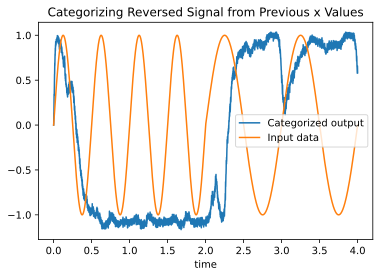

In [9]:
input = lambda t: np.sin(2 * np.pi * t * 2) if t < 2 else np.sin(2 * np.pi * t)
q2b(plot_title='Categorizing Reversed Signal from Previous x Values', x_values=lmu_data, input=input)

The model performs just as well as the model on a not reversed signal from part b) after ~0.5 seconds, and is very similar after this point, even still having the same decision 'jitter' when the 1 Hz signal is rising.However, the models are different as the categorized choice in the first ~0.25 seconds is incorrect and it takes until ~0.5 seconds to recover and output the correct value from there. This is happening because the model x values were derived from a different input signal than the one given in this question. Specifically, the model was given data with 1 Hz input to begin (and therefore was supposed to output 1), so it assumed that this would happen again and output 1 to begin the simulation. It took approximately 0.25 seconds for the model to decide the input was actually 2 Hz and begin outputting -1. This could be fixed by giving the model x values from the input signal given to the model, or potentially removing the specified x values and target entirely and letting Nengo compute the decoders from random x values. Alternatively, adding a delay to the category output to allow the model to correct for different input signals before outputting a signal would reduce error, but also prevent any signal from being outputted for the first ~0.25-0.5 seconds (or more, depending on case), which is also not ideal.

**d) Adjusting the number of neurons. [2 marks]** Repeat part b) but adjust the number of neurons in the `Ensemble` computing the differential equation.  Try 50, 100, 200, 500, 1000, 2000, and 5000.  How does the model behaviour change?  Why does this happen?  In addition to looking at the actual results for each run, also plot the RMSE in the classification as you adjust the number of neurons.  

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

Text(0.5, 0, 'num_neurons')

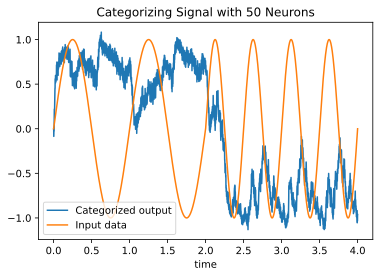

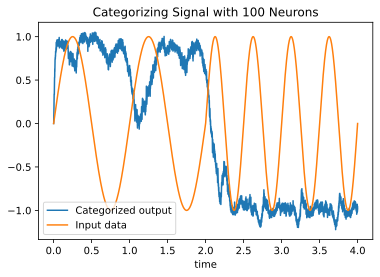

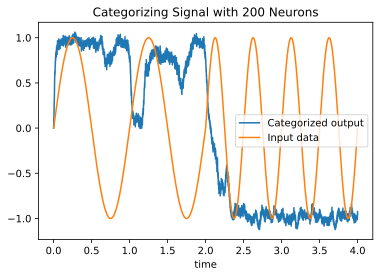

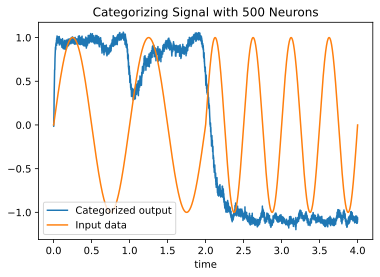

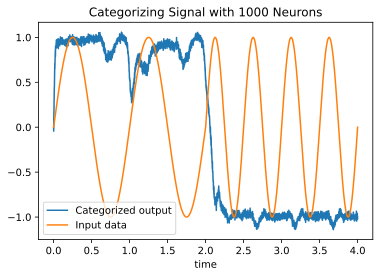

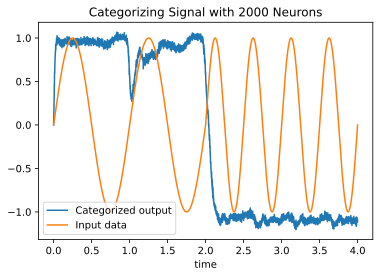

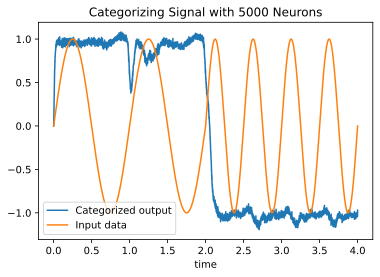

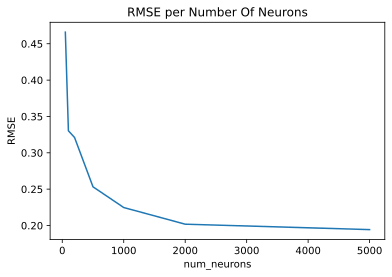

In [10]:
errors = []
num_neurons = [50, 100, 200, 500, 1000, 2000, 5000]
for neurons in num_neurons:
    errors.append(q2b(plot_title=f'Categorizing Signal with {neurons} Neurons', x_values=lmu_data,
                      rmse=True, num_neurons=neurons))

plt.figure()
plt.plot(num_neurons, errors)
plt.title('RMSE per Number Of Neurons')
plt.ylabel('RMSE')
plt.xlabel('num_neurons')

Adding more neurons makes the model's accuracy increase, but also increases the run time. This happens as a large number of neurons have a larger number of parameters that can be used to better approximate the function we desire, but more parameters results in longer run times. Also, from the last plot in the above output, it can be seen that there is an exponentially decreasing return on RMSE reduction compared to the number of neurons used to compute the differential equation.

**e) Adjusting the q value. [2 marks]** Repeat part b) (returning to 1000 neurons) but adjust the value of `q`.  Try 1, 2, 4, 8, 16, 32, and 64.  How does the model behaviour change?  Why does this happen? In addition to looking at the actual results for each run, also plot the RMSE in the classification as you adjust the number of q values.  

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

Text(0.5, 0, 'Dimensions')

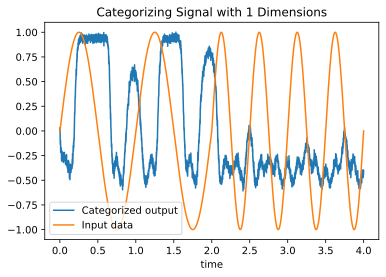

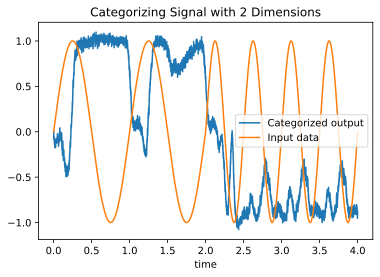

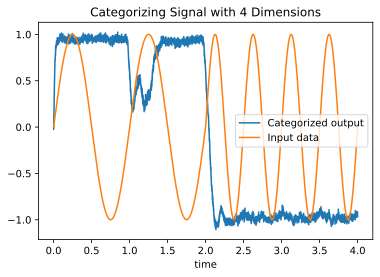

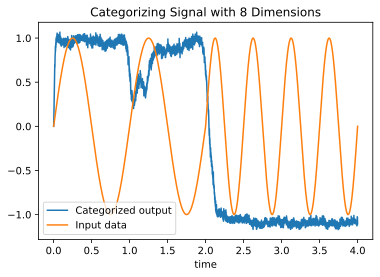

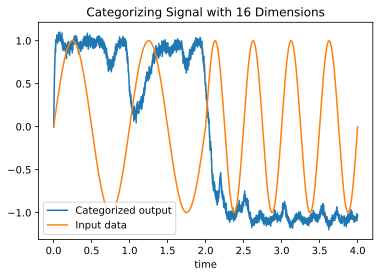

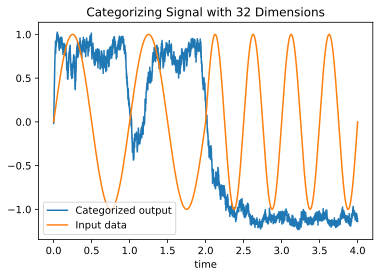

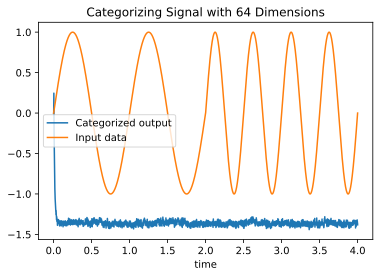

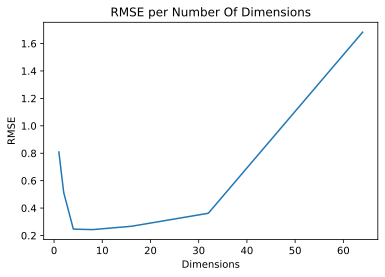

In [11]:
def q2e(input=lambda t: np.sin(2 * np.pi * t) if t < 2 else np.sin(2 * np.pi * t * 2), num_neurons=1000, recurrent_synapse=0.1,
        probe_synapse=0.01, sim_time=4, plot_title='', q=6, theta=0.5, x_values=[], rmse=False):

    model = nengo.Network()
    
    A, B= choosing_AB(q=q, theta=theta)
    A_transform = recurrent_synapse * A + np.identity(A.shape[0])
    B_transform = recurrent_synapse * B
    
    with model:
        input_node = nengo.Node(input)
        lmu_neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=q)
        nengo.Connection(input_node, lmu_neurons, transform=B_transform, synapse=recurrent_synapse)
        nengo.Connection(lmu_neurons, lmu_neurons, synapse=recurrent_synapse, transform=A_transform)
        lmu_probe = nengo.Probe(lmu_neurons, synapse=probe_synapse)

    sim_1 = nengo.Simulator(model)
    sim_1.run(sim_time)

    with model:
        input_node = nengo.Node(input)
        lmu_neurons = nengo.Ensemble(n_neurons=num_neurons, dimensions=q)
        category = nengo.Ensemble(n_neurons=50, dimensions=1)
        
        target = target_generation()
        x_values = sim_1.data[lmu_probe]
        
        nengo.Connection(input_node, lmu_neurons, transform=B_transform, synapse=recurrent_synapse)
        nengo.Connection(lmu_neurons, lmu_neurons, synapse=recurrent_synapse, transform=A_transform)
        nengo.Connection(lmu_neurons, category, eval_points=x_values, function=target)
        
        lmu_probe = nengo.Probe(lmu_neurons, synapse=probe_synapse)
        category_probe = nengo.Probe(category, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)
    time_range = sim.trange()
    
#     lmu_data = sim.data[lmu_probe]
    # recording input data from 0-4 seconds with 1000 data points per second
    input_data = [input(t) for t in np.linspace(0, sim_time, sim_time * 1000)]
    category_data = sim.data[category_probe]
    
    plt.figure()
    plt.plot(time_range, category_data, label='Categorized output')
    plt.plot(time_range, input_data, label='Input data')
    plt.legend()
    plt.xlabel('time')
    plt.title(plot_title)
    
    if rmse:
        return calc_rmse(category_data, target)

errors = []
dimensions = [1, 2, 4, 8, 16, 32, 64]
for q in dimensions:
    errors.append(q2e(plot_title=f'Categorizing Signal with {q} Dimensions', rmse=True, q=q))

plt.figure()
plt.plot(dimensions, errors)
plt.title('RMSE per Number Of Dimensions')
plt.ylabel('RMSE')
plt.xlabel('Dimensions')

The model behaviour starts becoming closer to expected going from 1 to 8 dimensions, and going from 8 to 64 dimensions the model starts becoming more noisy and less like expected. This behaviour can also be seen in the RMSE plot per dimensions above. This is happening as when starting with 1 dimension, there is not enough complexity to model the given system, and at ~8 dimensions the complexity for system modelled becomes ideal. Further increases to the number of dimensions results in more noise added to the system as the extra dimensions are not needed to model the system, and modelling performance begins to degrade further with more dimensions added.

# 3. Online Learning

Normally when building models with the Neural Engineering Framework, we compute the connection weights at the beginning and then leave them fixed while running the model.  But, we can also apply online learning rules to adjust the connection weights over time.  This has the effect of changing the function being computed.  One general learning rule is the PES rule, where you provide an extra input that indicates whether the output value should be increased or decreased.  This is generally called an error signal.

**a) Basic online learning. [2 marks]** Build a network that will learn the identity function.  You will need three `Ensembles`, one for the input, one for the output, and one for the error. Each one is 1-dimensional and uses 200 neurons.  For the input, use Nengo to randomly generate a 2Hz band-limited white noise signal as follows:

```python
stim = nengo.Node(nengo.processes.WhiteSignal(period=100, high=2, rms=0.3))
```

When making the learning connection, initialize it to compute the zero function and to use the PES learning rule as follows:
```python
def initialization(x):
    return 0
c = nengo.Connection(pre, post, function=initialization, learning_rule_type=nengo.PES(learning_rate=1e-4))
```

The error `Ensemble` should compute the difference between the output value and the desired output value.  For this initial question, we want the output value to be the same as the input value (i.e. we are learning the identity function).  Then connect the error `Ensemble` to the learning rule as follows:

```python
nengo.Connection(error, c.learning_rule)
```

(Note: for this question, leave the `synapse` values on the `Connections` at their default values)

Run the model for 10 seconds and plot the input value and the resulting output value (using a `Probe` with `synapse=0.01`).  The output should match the input fairly well after the first few seconds.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

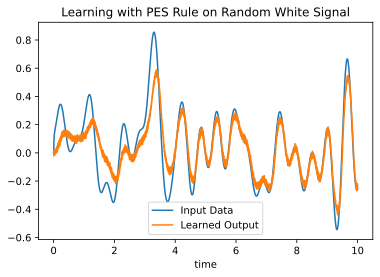

In [12]:
def identity_function(x):
    return 1 * x

def q3a(input=nengo.processes.WhiteSignal(period=100, high=2, rms=0.3), num_neurons=200, probe_synapse=0.01, sim_time=10,
        plot_title='', q=1, lr_rate = 1e-4, lr_penalty=-1, lr_reward=1, function=identity_function, show_plots=True):

    model = nengo.Network()
    
    def initialization(x):
        return 0

    with model:
        input_node = nengo.Node(input)
        pre = nengo.Ensemble(n_neurons=num_neurons, dimensions=q)
        post = nengo.Ensemble(n_neurons=num_neurons, dimensions=q)
        error = nengo.Ensemble(n_neurons=num_neurons, dimensions=q)
        
        nengo.Connection(input_node, pre)
        c = nengo.Connection(pre, post, function=initialization, learning_rule_type=nengo.PES(learning_rate=lr_rate))
        nengo.Connection(input_node, error, function=function, transform=lr_penalty)
        nengo.Connection(post, error, transform=lr_reward)
        nengo.Connection(error, c.learning_rule)
        
        input_probe = nengo.Probe(input_node, synapse=probe_synapse)
        pre_probe = nengo.Probe(pre, synapse=probe_synapse)
        post_probe = nengo.Probe(post, synapse=probe_synapse)
        error_probe = nengo.Probe(error, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)
    time_range = sim.trange()

    input_data = sim.data[input_probe]
    pre_data = sim.data[pre_probe]
    post_data = sim.data[post_probe]
    error_data = sim.data[error_probe]
    
    if show_plots:
        plt.figure()
        plt.plot(time_range, input_data, label='Input Data')
        plt.plot(time_range, post_data, label='Learned Output')
        plt.xlabel('time')
        plt.title(plot_title)
        plt.legend()
    return input_data, pre_data, post_data, error_data

input_data, pre_data, post_data, error_data = q3a(plot_title='Learning with PES Rule on Random White Signal')

**b) Error calculation. [1 mark]**  What would happen if you reversed the sign of the error calculation (i.e. if you did `target - output` rather than `output - target`?  Why does that happen?

Reversing the sign of the error calculation would also reverse the direction of the learning, causing the output to become as far as possible from the target within the bounds set by the radius of the model. Essentially, whenever the target is positive, the output would be 1 and whenever the target is negative, the output would be -1, no matter how large the target positive or negative value is. This occurs because flipping the sign of the error calculation changes the learning from minimizing the difference between the target and output to maximizing the difference.

**c) Computing metrics. [1 mark]**  Break your data up into 2-second chunks and compute the Root-Mean-Squared-Error between the target value (the stimulus itself) and the output from the model for each chunk.  Since the simulation is 10 seconds long, you should have 5 RMSE measures (one for the first 2 seconds, one for the second 2 seconds, one for the third 2 seconds, and so on).  Repeat the simulation 10 times and plot the average for each of these values.  The result should show that the model gets better over time, but does not reach 0 error.  

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

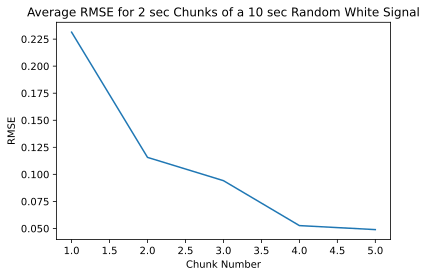

In [13]:
def calc_rmse(output, target):
    return np.sqrt(np.mean(np.power(output - target, 2)))

def q3c(sim_time=10, num_chunks=5, repeats=10, slices=5, lr_rate=1e-4, plot_title=''):
    repeat_errors = []
    for _ in range(repeats):
        input_data, pre_data, post_data, error_data = q3a(sim_time=sim_time, lr_rate=lr_rate, show_plots=False)

        chunk_errors = []
        chunk_size = int(len(input_data) / num_chunks)
        chunk_start = 0
        chunk_end = chunk_size
        for _ in range(num_chunks):
            input_chunk = input_data[chunk_start:chunk_end]
            post_chunk = post_data[chunk_start:chunk_end]
            error = calc_rmse(input_chunk, post_chunk)
            chunk_errors.append(error)
            temp = chunk_end
            chunk_start = chunk_end
            chunk_end = temp + chunk_size
        repeat_errors.append(chunk_errors)

    repeat_errors = np.array(repeat_errors)
    mean_errors = np.mean(repeat_errors, axis=0)

    time_range = np.linspace(1, num_chunks, num_chunks)
    plt.figure()
    plt.plot(time_range, mean_errors)
    plt.xlabel('Chunk Number')
    plt.ylabel('RMSE')
    plt.title(plot_title)

q3c(plot_title='Average RMSE for 2 sec Chunks of a 10 sec Random White Signal')

**d) Increasing learning time. [2 marks]**  Repeat part (c), but run the model for 100 seconds instead of 10 seconds.  How do the results change?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

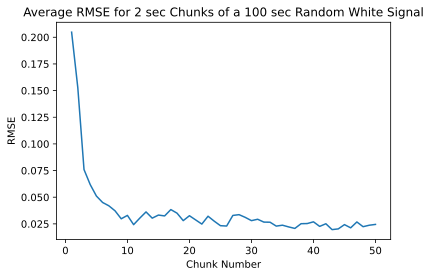

In [14]:
q3c(plot_title='Average RMSE for 2 sec Chunks of a 100 sec Random White Signal', sim_time=100, num_chunks=50)

Changing the model learning time to 100 seconds causes the error to get significantly smaller, with vastly diminishing returns after around 20 seconds of learning. In fact, the RMSE nearly becomes constant after this point, with increasing learning times having minimal impacts on the average RMSE. This occurs as the signal we are modelling is random with sometimes sharp changes in value, which neuron models struggle to perfectly model. As a result, there will always be some minimim error limit the model will approach when run for long time periods because of this. Also, there are random bumps in the RMSE as the error gets small which have now become apparent, which are likely due random chunks having some sharply varying input signals in the average. This effect would get reduced if more repeats were included in the averaging.

**e) Learning rates. [2 marks]**  Repeat part (d), but decrease the learning rate to `1e-5`.  How do the results change?  How do they compare to part (c)?

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

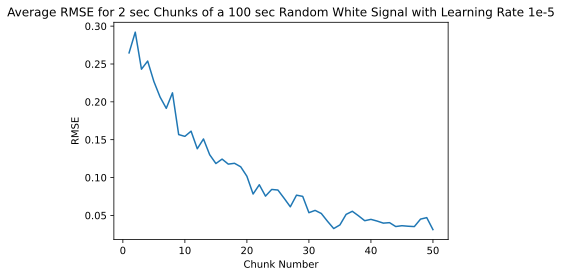

In [15]:
q3c(plot_title='Average RMSE for 2 sec Chunks of a 100 sec Random White Signal with Learning Rate 1e-5', sim_time=100, 
    num_chunks=50, lr_rate=1e-5)

Decreasing the learning rate causes the model to take longer to achieve similar RMSE values for signal modelling than the models from parts c) and d). This is expected as decreasing the learning rate by a factor of 10 increases the amount of time the model needs to initially reach similar RMSE values by 10. It is expected that the RMSE would level off as they did in part d) with sufficient simulation durations. Comparibly to part c), the lowest RMSE achieved was approximately 0.05 for both models, with the part e) model requiring a 10 times larger sim_time to initially achieve this error due to the 10 times slower learning rate.

**f) Improving performance. [1 mark]**  If you wanted to make the learned result even more accurate, how would you do this?  What would you change about the model and learning process?

Multiple improvements could be implemented to increase the accuracy of the learned result. One improvement would be to increase the number of neurons in the ensembles that are modelling the input function. More neurons would allow for more parameters that could be learned and therefore allow for a wider range of what input variations can be accurately modelled. Learning time could also be increased to allow the model to approach the limit of minimum RMSE and to accomodate the increased learning time likely needed for the increased parameters/neurons. In addition, learning rate could also be increased to make the model learn more quickly to save computation time, but this may actually very slightly increase error if the model is allowed to learn for very long times due to larger learning parameter changes having more difficulty landing on the absolute optimal parameters, but this would be run dependant and not a large source of error given the increases in computational efficiency. Similarly, the model could be pre-trained on similar function modelling to decrease training time needed to reach sufficient RMSE values.

Alternatively, bigger picture things could be altered, such as the used learning rule. There is the potential for other learning rules to work better for modelling this signal, which could be discovered given more research/experimentation.

**g) Learning other functions. [1 mark]** Repeat part (a), but have the system learn a function where the input is a scalar $x$, but the output is the vector $[x^2, -x]$.  This will involve changing the dimensionality of some of the `Ensembles` and adding a `function=` to be computed on the `Connection` from the `stim` to the `error`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

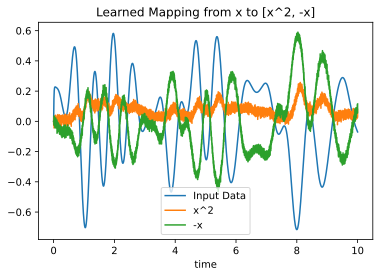

In [16]:
def function(x):
    return [np.power(x, 2), -1 * x]

def q3g(input=nengo.processes.WhiteSignal(period=100, high=2, rms=0.3), num_neurons=200, probe_synapse=0.01, sim_time=10,
        plot_title='', q=1, lr_rate = 1e-4, lr_penalty=-1, lr_reward=1, function=function, show_plots=True):

    model = nengo.Network()
    
    def initialization(x):
        return [0, 0]

    with model:
        input_node = nengo.Node(input)
        pre = nengo.Ensemble(n_neurons=num_neurons, dimensions=q)
        post = nengo.Ensemble(n_neurons=num_neurons, dimensions=2)
        error = nengo.Ensemble(n_neurons=num_neurons, dimensions=2)
        
        nengo.Connection(input_node, pre)
        c = nengo.Connection(pre, post, function=initialization, learning_rule_type=nengo.PES(learning_rate=lr_rate))
        nengo.Connection(input_node, error, function=function, transform=lr_penalty)
        nengo.Connection(post, error, transform=lr_reward)
        nengo.Connection(error, c.learning_rule)
        
        input_probe = nengo.Probe(input_node, synapse=probe_synapse)
        pre_probe = nengo.Probe(pre, synapse=probe_synapse)
        post_probe = nengo.Probe(post, synapse=probe_synapse)
        error_probe = nengo.Probe(error, synapse=probe_synapse)

    sim = nengo.Simulator(model)
    sim.run(sim_time)
    time_range = sim.trange()

    input_data = sim.data[input_probe]
    pre_data = sim.data[pre_probe]
    post_data = sim.data[post_probe]
    error_data = sim.data[error_probe]
    
    if show_plots:
        plt.figure()
        plt.plot(time_range, input_data, label='Input Data')
        plt.plot(time_range, post_data[:, 0], label='x^2')
        plt.plot(time_range, post_data[:, 1], label='-x')
        plt.xlabel('time')
        plt.title(plot_title)
        plt.legend()

q3g(plot_title='Learned Mapping from x to [x^2, -x]')